In [1]:
import yfinance as yf
from yahoofinancials import YahooFinancials
import plotly.graph_objects as go
import pandas as pd
import glob
import os
import ta
import numpy as np
from ta import add_all_ta_features
from ta.utils import dropna
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno


pd.set_option("display.max_columns",100)
plt.rcParams["figure.figsize"]=(24,7)
import warnings
warnings.filterwarnings("ignore")

In [2]:
dxy_df = yf.download("DX-Y.NYB", start = "2009-01-03")
#print(dxy_df)
dxy_df.to_csv("dxy_df.csv")

sp500_df = yf.download("^GSPC", start = "2009-01-03")
#print(sp500_df)
sp500_df.to_csv("sp500_df.csv")

nasdaq_df = yf.download("^IXIC", start = "2009-01-03")
#print(nasdaq_df)
nasdaq_df.to_csv("nasdaq_df.csv")

btc_df = yf.download("BTC-USD", start = "2009-01-03")
#print(btc_df)
btc_df.to_csv("btc_df.csv")

data = pd.concat([sp500_df["Close"],nasdaq_df["Close"],dxy_df["Close"]],axis=1)
data.columns =["spClose", "nsdqClose","dxyClose"]
data


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,spClose,nsdqClose,dxyClose
Date,,,
2009-01-02,931.799988,1632.209961,81.839996
2009-01-05,927.450012,1628.030029,82.639999
2009-01-06,934.700012,1652.380005,82.849998
2009-01-07,906.650024,1599.060059,82.279999
2009-01-08,909.729980,1617.010010,81.540001
...,...,...,...
2022-05-19,3900.790039,11388.500000,102.720001
2022-05-20,3901.360107,11354.620117,103.150002
2022-05-23,3973.750000,11535.269531,102.080002


In [3]:
price = pd.read_csv('btc_df.csv')
price.set_index(price.Date,inplace=True)
price = price.drop( "Date", axis = 1)
price.index = pd.to_datetime(price.index)
price

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100
...,...,...,...,...,...,...
2022-05-21,29199.859375,29588.869141,29027.394531,29432.226562,29432.226562,17274840442
2022-05-22,29432.472656,30425.861328,29275.183594,30323.722656,30323.722656,21631532270
2022-05-23,30309.396484,30590.585938,28975.560547,29098.910156,29098.910156,31483454557


In [4]:
df = pd.merge(data, price, on = "Date",how = "right")

In [5]:
others = pd.read_excel("Coin_Metrics_Network_Data_2022-05-24T15-38.xlsx")
    
others.rename(columns={"Time":"Date"},inplace=True)
others.set_index(others.Date,inplace=True)
others = others.drop( "Date", axis = 1)
others.index = pd.to_datetime(others.index)
others = others.astype(float)
others.dtypes

BTC / USD Denominated Closing Price                                    float64
BTC / Free Float MVRV (Free Float Market Cap / Realized Market Cap)    float64
BTC / MVRV (Market Cap / Realized Market Cap)                          float64
BTC / BTC Denominated Price                                            float64
BTC / Free Float Market Cap (USD)                                      float64
BTC / Realized Market Cap (USD)                                        float64
BTC / Daily Inflation Rate                                             float64
BTC / All Time Miner Revenue (USD)                                     float64
BTC / Total Fees (USD)                                                 float64
BTC / Miner Supply (USD)                                               float64
BTC / Exchange Deposits (USD)                                          float64
BTC / Exchange Withdrawals (USD)                                       float64
BTC / Annual Inflation Rate                         

In [6]:


df = pd.merge(df, others, on = "Date",how = "left")

df.head()

,spClose,nsdqClose,dxyClose,Open,High,Low,Close,Adj Close,Volume,BTC / USD Denominated Closing Price,BTC / Free Float MVRV (Free Float Market Cap / Realized Market Cap),BTC / MVRV (Market Cap / Realized Market Cap),BTC / BTC Denominated Price,BTC / Free Float Market Cap (USD),BTC / Realized Market Cap (USD),BTC / Daily Inflation Rate,BTC / All Time Miner Revenue (USD),BTC / Total Fees (USD),BTC / Miner Supply (USD),BTC / Exchange Deposits (USD),BTC / Exchange Withdrawals (USD),BTC / Annual Inflation Rate
Date,,,,,,,,,,,,,,,,,,,,,,
2014-09-17,2001.569946,4562.189941,84.699997,465.864014,468.174011,452.421997,457.334015,457.334015,21056800,456.339891,1.199159,1.285606,1.0,5.653153e+09,4.714267e+09,0.035012,9.899970e+08,5494.516757,9.222782e+08,1.065752e+07,9.743524e+06,12.779448
2014-09-18,2011.359985,4593.430176,84.320000,456.859985,456.859985,413.104004,424.440002,424.440002,34483200,426.880107,1.123790,1.205033,1.0,5.288983e+09,4.706379e+09,0.033683,9.919125e+08,5214.342615,8.630416e+08,1.696480e+07,1.359548e+07,12.294359
2014-09-19,2010.400024,4579.790039,84.800003,424.102997,427.834991,384.532013,394.795990,394.795990,37919700,393.893891,1.039736,1.115123,1.0,4.880889e+09,4.694356e+09,0.032167,9.936007e+08,4261.732292,7.968963e+08,1.770344e+07,1.694158e+07,11.741112
2014-09-20,NaN,NaN,NaN,394.673004,423.295990,389.882996,408.903992,408.903992,36863600,411.041343,1.087147,1.166208,1.0,5.094028e+09,4.685686e+09,0.033097,9.954135e+08,4235.264753,8.324557e+08,9.387692e+06,8.728492e+06,12.080420
2014-09-21,NaN,NaN,NaN,408.084991,412.425995,393.181000,398.821014,398.821014,26580100,400.404531,1.059462,1.136713,1.0,4.962847e+09,4.684308e+09,0.030831,9.970588e+08,3638.427361,8.117053e+08,1.050540e+07,1.089809e+07,11.253284


In [7]:
def pull_data():
    dxy_df = yf.download("DX-Y.NYB", start = "2009-01-03")
    #print(dxy_df)
    dxy_df.to_csv("dxy_df.csv")

    sp500_df = yf.download("^GSPC", start = "2009-01-03")
    #print(sp500_df)
    sp500_df.to_csv("sp500_df.csv")

    nasdaq_df = yf.download("^IXIC", start = "2009-01-03")
    #print(nasdaq_df)
    nasdaq_df.to_csv("nasdaq_df.csv")

    btc_df = yf.download("BTC-USD", start = "2009-01-03")
    #print(btc_df)
    btc_df.to_csv("btc_df.csv")

    data = pd.concat([sp500_df["Close"],nasdaq_df["Close"],dxy_df["Close"]],axis=1)
    data.columns =["spClose", "nsdqClose","dxyClose"]

    price = pd.read_csv('btc_df.csv')
    price.set_index(price.Date,inplace=True)
    price = price.drop( "Date", axis = 1)
    price.index = pd.to_datetime(price.index)

    others = pd.read_excel("Coin_Metrics_Network_Data_2022-05-24T15-38.xlsx")
    
    others.rename(columns={"Time":"Date"},inplace=True)
    others.set_index(others.Date,inplace=True)
    others = others.drop( "Date", axis = 1)
    others.index = pd.to_datetime(others.index)
    others = others.astype(float)
    

    df = pd.merge(data, price, on = "Date",how = "right")

    df = pd.merge(df, others, on = "Date",how = "left")

    df.to_csv("last_df.csv")
    last_data = pd.read_csv("last_df.csv")
    last_data.set_index(last_data.Date,inplace=True)
    last_data = last_data.drop( "Date", axis = 1)
    return last_data


In [8]:
def applytechnicals(df):


    df.fillna(method="ffill", inplace=True)
      
    df["Sma21_manuel"]=df.Close.rolling(21).mean()
    df["Sma50_manuel"]=df.Close.rolling(50).mean()
    df["Sma200_manuel"]=df.Close.rolling(200).mean()
    df["Ema21_manuel"]=df.Close.ewm(21).mean()
    df["Ema50_manuel"]=df.Close.ewm(50).mean()
    df["Ema200_manuel"]=df.Close.ewm(200).mean()
    df["rsi14_manuel"] = ta.momentum.rsi(df.Close, window = 14)
    df["rsi40_manuel"] = ta.momentum.rsi(df.Close, window = 40)
    df["rsi200_manuel"] = ta.momentum.rsi(df.Close, window = 200)
    df["macd_manuel"] = ta.trend.macd_diff(df.Close,window_slow=9,window_fast=1,window_sign=5)
    df["macd_dem_manuel"] = ta.trend.macd_signal(df.Close,window_slow=9,window_fast=1,window_sign=5)
    df["macd_dif_manuel"] = ta.trend.macd(df.Close, window_slow=9, window_fast=1)
    df["tsi_manuel"] = ta.momentum.tsi(df.Close, window_slow=9, window_fast=1)
    df["%K_manuel"] = ta.momentum.stoch(df.High, df.Low, df.Close, window = 14, smooth_window=3)
    df["%D_manuel"] = df["%K_manuel"].rolling(3).mean()
    # Calculation of OnBalanceVolume
    """ OBV = []
    OBV.append(0)
    # Loop through dataset(ClosePrice) from the second row to the end of dataset
    for i in range(1, len(df.Close)):
        if df.Close[i] > df.Close[i-1]:
            OBV.append(OBV[-1] + df.Volume[i])
        elif df.Close[i] < df.Close[i-1]:
            OBV.append(OBV[-1] - df.Volume[i])
        else:
            OBV.append(OBV[-1])
    df["OBV"] = OBV
    df["OBV_EMA"] = df["OBV"].ewm(span=20, adjust=False).mean() """

    
    
    df.dropna(inplace = True)
    
    #data[column].ewm(span=period, adjust=False).mean()

In [9]:
def add_ta_features():
    df = pull_data()
    # https://github.com/bukosabino/ta
    df = add_all_ta_features(df, open="Open", high="High", low="Low", close="Close", volume="Volume")
    applytechnicals(df)
    df.dropna(inplace = True)
    return df

In [10]:
df = add_ta_features()
df.head(10)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,spClose,nsdqClose,dxyClose,Open,High,Low,Close,Adj Close,Volume,BTC / USD Denominated Closing Price,BTC / Free Float MVRV (Free Float Market Cap / Realized Market Cap),BTC / MVRV (Market Cap / Realized Market Cap),BTC / BTC Denominated Price,BTC / Free Float Market Cap (USD),BTC / Realized Market Cap (USD),BTC / Daily Inflation Rate,BTC / All Time Miner Revenue (USD),BTC / Total Fees (USD),BTC / Miner Supply (USD),BTC / Exchange Deposits (USD),BTC / Exchange Withdrawals (USD),BTC / Annual Inflation Rate,volume_adi,volume_obv,volume_cmf,volume_fi,volume_em,volume_sma_em,volume_vpt,volume_vwap,volume_mfi,volume_nvi,volatility_bbm,volatility_bbh,volatility_bbl,volatility_bbw,volatility_bbp,volatility_bbhi,volatility_bbli,volatility_kcc,volatility_kch,volatility_kcl,volatility_kcw,volatility_kcp,volatility_kchi,volatility_kcli,volatility_dcl,volatility_dch,volatility_dcm,volatility_dcw,...,trend_stc,trend_adx,trend_adx_pos,trend_adx_neg,trend_cci,trend_visual_ichimoku_a,trend_visual_ichimoku_b,trend_aroon_up,trend_aroon_down,trend_aroon_ind,trend_psar_up,trend_psar_down,trend_psar_up_indicator,trend_psar_down_indicator,momentum_rsi,momentum_stoch_rsi,momentum_stoch_rsi_k,momentum_stoch_rsi_d,momentum_tsi,momentum_uo,momentum_stoch,momentum_stoch_signal,momentum_wr,momentum_ao,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr,Sma21_manuel,Sma50_manuel,Sma200_manuel,Ema21_manuel,Ema50_manuel,Ema200_manuel,rsi14_manuel,rsi40_manuel,rsi200_manuel,macd_manuel,macd_dem_manuel,macd_dif_manuel,tsi_manuel,%K_manuel,%D_manuel
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-04-04,2066.959961,4886.939941,97.440002,254.291000,255.257996,251.100006,253.697006,253.697006,12493500,253.945849,0.772227,0.853817,1.0,3.219855e+09,4.169572e+09,0.027285,1.220002e+09,3378.135444,5.029574e+08,5.131953e+06,4.642707e+06,9.958849,-2.362789e+08,-6831236,0.000677,-1.222171e+07,-26.025839,-25.636915,8.978519e+04,250.999821,53.223856,749.735744,256.635451,282.021742,231.249159,19.783932,0.442125,0.0,0.0,249.011769,257.045068,240.978469,6.452144,0.791614,0.0,0.0,236.514999,294.112000,265.313499,22.443119,...,0.000381,20.736798,21.287803,25.007983,-25.132240,262.237244,251.945000,4.0,76.0,-72.0,279.680868,258.444973,0.0,0.0,47.508324,0.798563,0.796259,0.632522,-10.268437,53.262355,42.131352,42.076588,-57.868648,-17.814433,-4.889774,-1.632277,-1.517749,-0.114528,-11.261372,-7.816525,-3.444847,256.823758,-0.245751,-0.246054,-44.526976,258.052477,259.574362,310.843170,258.103645,268.015831,296.312601,47.508324,47.901000,45.132844,1.848366,0.182302,2.030668,14.103251,42.131352,42.076588
2015-04-05,2066.959961,4886.939941,97.440002,253.761002,260.674988,251.942001,260.597992,260.597992,19649200,261.112136,0.792117,0.877909,1.0,3.303669e+09,4.170684e+09,0.026386,1.220972e+09,3943.148860,5.172426e+08,6.766769e+06,4.240807e+06,9.630854,-2.169761e+08,12817964,0.031281,8.895512e+06,139.088748,-38.309348,5.037884e+05,250.575549,53.316813,749.735744,255.135701,275.334322,234.937080,15.833630,0.635214,0.0,0.0,249.859235,257.820932,241.897537,6.372946,1.174401,1.0,0.0,236.514999,292.364990,264.439995,21.890308,...,50.000191,19.322020,23.865495,23.425734,19.392032,269.915749,251.945000,4.0,72.0,-68.0,236.514999,258.444973,1.0,0.0,52.432292,1.000000,0.878352,0.777938,-8.226263,64.166453,59.052999,48.282747,-40.947001,-15.376148,6.108834,-1.264614,-1.467122,0.202508,-11.552585,-8.563737,-2.988848,257.028844,2.720168,2.683829,-43.018017,256.824143,259.639901,309.859490,258.217035,267.867615,296.031915,52.432292,49.251266,45.493022,4.642014,2.503309,7.145323,41.933498,59.052999,48.282747
2015-04-06,2080.620117,4917.319824,97.110001,260.721008,261.798004,254.574997,255.492004,255.492004,20034200,256.367387,0.777761,0.862131,1.0,3.243864e+09,4.170775e+09,0.022459,1.221783e+09,4043.257837,5.079250e+08,7.976790e+06

In [11]:
df.isnull().sum()

spClose            0
nsdqClose          0
dxyClose           0
Open               0
High               0
                  ..
macd_dem_manuel    0
macd_dif_manuel    0
tsi_manuel         0
%K_manuel          0
%D_manuel          0
Length: 123, dtype: int64

In [12]:
print('Null Values:\n',df.isnull().sum())
print("***********************")
print('If any NA values:\n', df.isnull().any())

Null Values:
 spClose            0
nsdqClose          0
dxyClose           0
Open               0
High               0
                  ..
macd_dem_manuel    0
macd_dif_manuel    0
tsi_manuel         0
%K_manuel          0
%D_manuel          0
Length: 123, dtype: int64
***********************
If any NA values:
 spClose            False
nsdqClose          False
dxyClose           False
Open               False
High               False
                   ...  
macd_dem_manuel    False
macd_dif_manuel    False
tsi_manuel         False
%K_manuel          False
%D_manuel          False
Length: 123, dtype: bool


<AxesSubplot:>

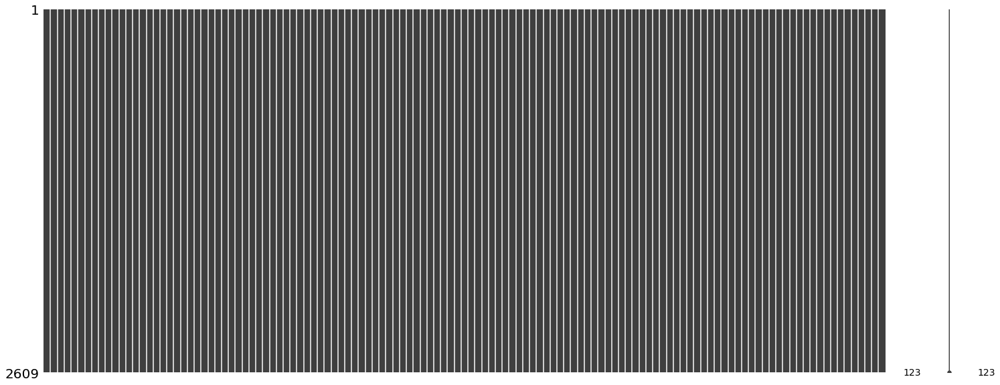

In [13]:

msno.matrix(df)

In [14]:
df.describe()

,spClose,nsdqClose,dxyClose,Open,High,Low,Close,Adj Close,Volume,BTC / USD Denominated Closing Price,BTC / Free Float MVRV (Free Float Market Cap / Realized Market Cap),BTC / MVRV (Market Cap / Realized Market Cap),BTC / BTC Denominated Price,BTC / Free Float Market Cap (USD),BTC / Realized Market Cap (USD),BTC / Daily Inflation Rate,BTC / All Time Miner Revenue (USD),BTC / Total Fees (USD),BTC / Miner Supply (USD),BTC / Exchange Deposits (USD),BTC / Exchange Withdrawals (USD),BTC / Annual Inflation Rate,volume_adi,volume_obv,volume_cmf,volume_fi,volume_em,volume_sma_em,volume_vpt,volume_vwap,volume_mfi,volume_nvi,volatility_bbm,volatility_bbh,volatility_bbl,volatility_bbw,volatility_bbp,volatility_bbhi,volatility_bbli,volatility_kcc,volatility_kch,volatility_kcl,volatility_kcw,volatility_kcp,volatility_kchi,volatility_kcli,volatility_dcl,volatility_dch,volatility_dcm,volatility_dcw,...,trend_stc,trend_adx,trend_adx_pos,trend_adx_neg,trend_cci,trend_visual_ichimoku_a,trend_visual_ichimoku_b,trend_aroon_up,trend_aroon_down,trend_aroon_ind,trend_psar_up,trend_psar_down,trend_psar_up_indicator,trend_psar_down_indicator,momentum_rsi,momentum_stoch_rsi,momentum_stoch_rsi_k,momentum_stoch_rsi_d,momentum_tsi,momentum_uo,momentum_stoch,momentum_stoch_signal,momentum_wr,momentum_ao,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr,Sma21_manuel,Sma50_manuel,Sma200_manuel,Ema21_manuel,Ema50_manuel,Ema200_manuel,rsi14_manuel,rsi40_manuel,rsi200_manuel,macd_manuel,macd_dem_manuel,macd_dif_manuel,tsi_manuel,%K_manuel,%D_manuel
count,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2.609000e+03,2609.000000,2609.000000,2609.000000,2609.0,2.609000e+03,2.609000e+03,2609.000000,2.609000e+03,2.609000e+03,2.609000e+03,2.609000e+03,2.609000e+03,2609.000000,2.609000e+03,2.609000e+03,2609.000000,2.609000e+03,2609.000000,2609.000000,2.609000e+03,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,...,2.609000e+03,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000,2609.000000
mean,2934.408705,8429.015787,95.778135,13158.673448,13503.539567,12776.283019,13168.180901,13168.180901,1.636365e+10,13155.079816,1.458441,1.803311,1.0,1.896066e+11,1.211155e+11,0.011763,1.284855e+10,9.285922e+05,2.368975e+10,3.667734e+08,3.820483e+08,4.293403,1.093243e+12,6.064273e+11,0.097137,-1.540923e+11,-84.657384,-84.959645,6.762275e+07,13087.956955,54.326420,912.421471,13060.554662,14801.948137,11319.161187,24.470948,0.565847,0.090839,0.044845,13098.651186,13823.945314,12373.357058,9.241762,0.652347,0.293599,0.164048,11176.866335,14865.151883,13021.009109,25.781416,...,5.347782e+01,31.064331,26.108358,22.138120,21.411809,12686.161715,12506.142260,54.896129,40.892296,14.003833,12677.016797,13492.766816,0.036796,0.036412,54.092920,0.515536,0.515486,0.515367,8.060465,54.290579,56.359506,56.351557,-43.640494,176.436388,3.201294,1.095754,1.104307,-0.008553,1.040145,1.033200,0.006944,13234.064209,0.256997,0.182345,2779.335556,13054.599436,12855.415727,11659.589355,12894.106915,12441.469772,10041.482160,54.092920,53.704401,53.294432,-0.309590,45.645463,45.335872,9.033454,56.359506,56.351557
std,793.718261,3333.04805

In [15]:
df.corr()

,spClose,nsdqClose,dxyClose,Open,High,Low,Close,Adj Close,Volume,BTC / USD Denominated Closing Price,BTC / Free Float MVRV (Free Float Market Cap / Realized Market Cap),BTC / MVRV (Market Cap / Realized Market Cap),BTC / BTC Denominated Price,BTC / Free Float Market Cap (USD),BTC / Realized Market Cap (USD),BTC / Daily Inflation Rate,BTC / All Time Miner Revenue (USD),BTC / Total Fees (USD),BTC / Miner Supply (USD),BTC / Exchange Deposits (USD),BTC / Exchange Withdrawals (USD),BTC / Annual Inflation Rate,volume_adi,volume_obv,volume_cmf,volume_fi,volume_em,volume_sma_em,volume_vpt,volume_vwap,volume_mfi,volume_nvi,volatility_bbm,volatility_bbh,volatility_bbl,volatility_bbw,volatility_bbp,volatility_bbhi,volatility_bbli,volatility_kcc,volatility_kch,volatility_kcl,volatility_kcw,volatility_kcp,volatility_kchi,volatility_kcli,volatility_dcl,volatility_dch,volatility_dcm,volatility_dcw,...,trend_stc,trend_adx,trend_adx_pos,trend_adx_neg,trend_cci,trend_visual_ichimoku_a,trend_visual_ichimoku_b,trend_aroon_up,trend_aroon_down,trend_aroon_ind,trend_psar_up,trend_psar_down,trend_psar_up_indicator,trend_psar_down_indicator,momentum_rsi,momentum_stoch_rsi,momentum_stoch_rsi_k,momentum_stoch_rsi_d,momentum_tsi,momentum_uo,momentum_stoch,momentum_stoch_signal,momentum_wr,momentum_ao,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr,Sma21_manuel,Sma50_manuel,Sma200_manuel,Ema21_manuel,Ema50_manuel,Ema200_manuel,rsi14_manuel,rsi40_manuel,rsi200_manuel,macd_manuel,macd_dem_manuel,macd_dif_manuel,tsi_manuel,%K_manuel,%D_manuel
spClose,1.000000,0.989065,-0.282321,0.917070,0.916316,0.918256,0.917083,0.917083,0.716323,0.917151,0.247442,0.335206,NaN,0.916592,0.950521,-0.762950,0.960660,0.283953,0.917740,0.722795,0.733418,-0.762950,0.947938,0.934862,-0.082457,-0.053296,-0.031927,-0.100636,0.003208,0.919694,-0.126652,-0.254542,0.920133,0.915107,0.919634,0.081157,-0.111136,-0.066181,0.053309,0.918864,0.916491,0.920822,0.215343,-0.089699,-0.072344,0.051675,0.922091,0.916309,0.921320,0.088798,...,-0.072936,-0.018459,-0.243275,0.019259,-0.106736,0.915457,0.920352,-0.026948,0.163296,-0.105311,0.914423,0.915356,0.017626,0.019543,-0.110729,-0.034593,-0.037790,-0.039051,-0.110267,-0.038039,-0.070173,-0.072514,-0.070173,0.028319,-0.049664,-0.064642,-0.059376,-0.030060,-0.086257,-0.095463,-0.005654,0.920542,-0.018442,-0.018642,0.917083,0.920259,0.922588,0.926220,0.926591,0.934424,0.931105,-0.110729,-0.112107,0.016448,-0.003975,0.011394,0.007502,-0.092393,-0.070173,-0.072514
nsdqClose,0.989065,1.000000,-0.330029,0.918216,0.917989,0.919200,0.918769,0.918769,0.755449,0.918911,0.268341,0.357386,NaN,0.918504,0.926294,-0.758249,0.945027,0.310730,0.919472,0.733072,0.744901,-0.758249,0.952635,0.956414,-0.044997,-0.023916,-0.024519,-0.079456,0.020886,0.918003,-0.104033,-0.307552,0.917179,0.913374,0.915131,0.078239,-0.086858,-0.057975,0.037031,0.918035,0.916340,0.919234,0.213929,-0.069500,-0.059219,0.032104,0.917893,0.914656,0.918560,0.084047,...,-0.066933,-0.004037,-0.221879,-0.010992,-0.083573,0.902478,0.902365,-0.004916,0.138500,-0.078942,0.911670,0.912796,0.017900,0.019334,-0.078263,-0.027768,-0.030626,-0.031988,-0.076427,-0.009487,-0.046157,-0.047495,-0.046157,0.072663,-0.028591,-0.035655,-0.031152,-0.022088,-0.094567,-0.105611,-0.004251,0.920292,-0.010521,-0.010782,0.918769,0.917078,0.913553,0.898323,0.919351,0.918946,0.901109,-0.078263,-0.071319,0.046958,-0.001808,0.047213,0.037920,-0.068125,-0.046157,-0.047495
dxyClose,-0.282321,-0.330029,1.000000,-0.336263,-0.340472,-0.331597,-0.337983,-0.337983,-0.279088,-0.337534,-0.332038,-0.344006,NaN,-0.335093,-0.197487,0.192359,-0.119510,-0.419299,-0.338247,-0.392648,-0.380702,0.192359,-0.242024,-0.309511,-0.050153,-0.048468,-0.005279,-0.015142,-0.030866,-0.326961,-0.029833,-0.167643,-0.322095,-0.337149,-0.300290,-0.199293,-0.003970,0.008509,0.024042,-0.329371,-0.337221,-0.320331,-0.329405,0.002887,0.013888,0.

In [26]:
corr = df.corr().Close[:25]
corr[np.argsort(corr, axis=0)]

BTC / Exchange Withdrawals (USD)                                       0.811921
BTC / Realized Market Cap (USD)                                        0.937839
dxyClose                                                              -0.337983
volume_obv                                                             0.938702
BTC / Free Float MVRV (Free Float Market Cap / Realized Market Cap)    0.382526
BTC / All Time Miner Revenue (USD)                                     0.869017
BTC / MVRV (Market Cap / Realized Market Cap)                          0.455778
Volume                                                                 0.710184
BTC / Exchange Deposits (USD)                                          0.812059
BTC / Miner Supply (USD)                                               0.999967
BTC / Daily Inflation Rate                                            -0.605257
spClose                                                                0.917083
volume_cmf                              

In [44]:
df[["BTC / BTC Denominated Price","Adj Close","BTC / USD Denominated Closing Price","others_cr","BTC / Miner Supply (USD)", 
                    "BTC / Free Float Market Cap (USD)","Open", "High","Low"]]
dropped_columns = ["BTC / BTC Denominated Price","Adj Close","BTC / USD Denominated Closing Price","others_cr","BTC / Miner Supply (USD)", 
                    "BTC / Free Float Market Cap (USD)","Open", "High","Low"]
df.drop(columns=dropped_columns, inplace=True)

In [45]:
corr = df.corr().Close[25:50]
corr[np.argsort(corr, axis=0)]

volatility_bbp      -0.067495
volatility_bbhi     -0.061025
volatility_kcp      -0.052298
volatility_kchi     -0.046360
trend_macd_diff     -0.031158
volatility_dcp      -0.029444
volatility_kcli      0.022690
volatility_bbli      0.026583
volatility_ui        0.124013
volatility_bbw       0.127469
volatility_dcw       0.140034
trend_macd           0.182052
trend_macd_signal    0.201392
volatility_kcw       0.261676
volatility_atr       0.917630
volatility_bbl       0.985614
volatility_dcl       0.988698
trend_sma_slow       0.989608
volatility_bbh       0.991418
volatility_dch       0.992278
volatility_dcm       0.993441
volatility_kch       0.995651
trend_sma_fast       0.995693
volatility_kcl       0.996067
volatility_kcc       0.996205
Name: Close, dtype: float64

In [46]:
corr = df.corr().Close[50:75]
corr[np.argsort(corr, axis=0)]

trend_adx_pos             -0.183302
trend_stc                 -0.078041
trend_cci                 -0.065010
trend_vortex_ind_diff     -0.061252
trend_aroon_ind           -0.060204
trend_vortex_ind_pos      -0.058120
trend_dpo                 -0.030238
trend_adx                 -0.026605
trend_kst_diff            -0.023759
trend_adx_neg             -0.001743
trend_aroon_up             0.001321
trend_mass_index           0.011076
trend_trix                 0.022231
trend_kst                  0.026308
trend_kst_sig              0.033896
trend_vortex_ind_neg       0.062381
trend_aroon_down           0.110962
trend_visual_ichimoku_b    0.942150
trend_visual_ichimoku_a    0.959724
trend_ichimoku_b           0.980922
trend_ichimoku_base        0.991576
trend_ema_slow             0.992123
trend_ichimoku_a           0.995393
trend_ema_fast             0.996877
trend_ichimoku_conv        0.997173
Name: Close, dtype: float64

In [47]:
corr = df.corr().Close[75:100]
corr[np.argsort(corr, axis=0)]

momentum_pvo_signal         -0.081576
momentum_pvo                -0.072955
momentum_rsi                -0.056180
momentum_tsi                -0.051358
momentum_ppo_hist           -0.028844
momentum_stoch_signal       -0.028763
momentum_wr                 -0.028398
momentum_stoch              -0.028398
momentum_stoch_rsi_d        -0.018154
momentum_stoch_rsi_k        -0.017959
momentum_stoch_rsi          -0.016837
others_dlr                  -0.003133
momentum_pvo_hist           -0.003073
others_dr                   -0.001829
momentum_uo                  0.001260
momentum_roc                 0.001848
momentum_ppo                 0.009731
trend_psar_up_indicator      0.015454
trend_psar_down_indicator    0.016235
momentum_ppo_signal          0.018627
momentum_ao                  0.143010
trend_psar_down              0.987524
trend_psar_up                0.988598
Sma21_manuel                 0.991738
momentum_kama                0.996803
Name: Close, dtype: float64

In [48]:
corr = df.corr().Close[100:]
corr[np.argsort(corr, axis=0)]

rsi14_manuel      -0.056180
tsi_manuel        -0.050622
%D_manuel         -0.028763
%K_manuel         -0.028398
rsi40_manuel      -0.021600
macd_manuel       -0.004205
macd_dif_manuel    0.078730
macd_dem_manuel    0.098281
rsi200_manuel      0.150031
Ema200_manuel      0.912639
Sma200_manuel      0.914117
Ema50_manuel       0.966089
Sma50_manuel       0.977788
Ema21_manuel       0.985894
Name: Close, dtype: float64

In [50]:
from scipy.stats import skew
for i in df.columns:
    print(i, skew(df[i]))

spClose 0.7800598365548498
nsdqClose 0.7999663902456371
dxyClose -0.001731395780976547
Close 1.5317780062170938
Volume 2.9267904770870516
BTC / Free Float MVRV (Free Float Market Cap / Realized Market Cap) 0.9117081792637256
BTC / MVRV (Market Cap / Realized Market Cap) 0.818083912119598
BTC / Realized Market Cap (USD) 1.4073958193549112
BTC / Daily Inflation Rate 1.1270332858628636
BTC / All Time Miner Revenue (USD) 0.9496932582649278
BTC / Total Fees (USD) 4.213609767069025
BTC / Exchange Deposits (USD) 2.486501125839411
BTC / Exchange Withdrawals (USD) 2.452174753506473
BTC / Annual Inflation Rate 1.1270332858628633
volume_adi 1.2659143959910024
volume_obv 1.0785960368493859
volume_cmf 0.05128209349752177
volume_fi -0.7735576948995236
volume_em -3.990018327333768
volume_sma_em -1.0232549994217826
volume_vpt -0.3759733788682936
volume_vwap 1.5258542572685245
volume_mfi 0.028703081472705252
volume_nvi 1.5242814173183177
volatility_bbm 1.525980871533655
volatility_bbh 1.494658704247395

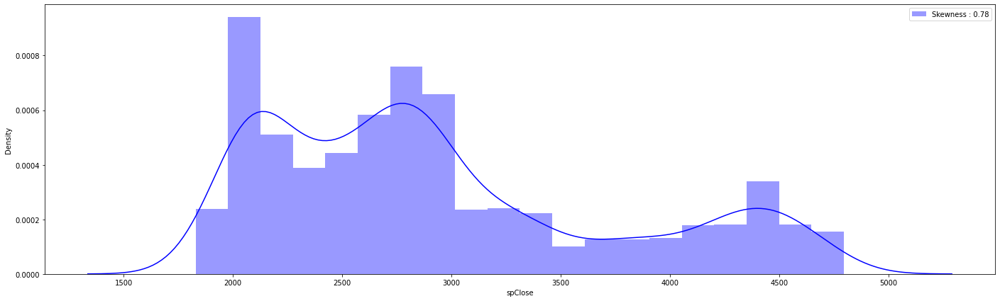

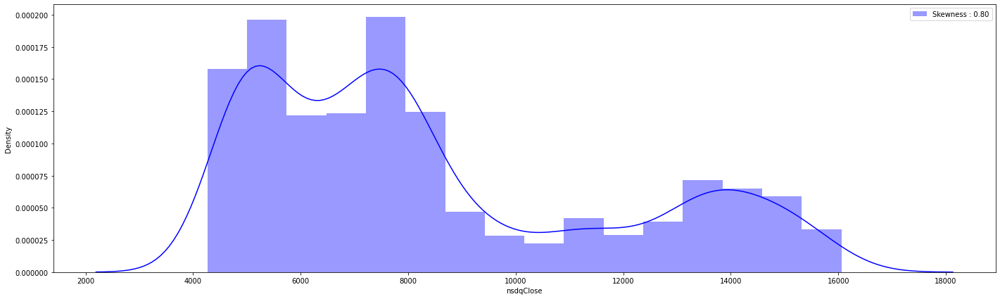

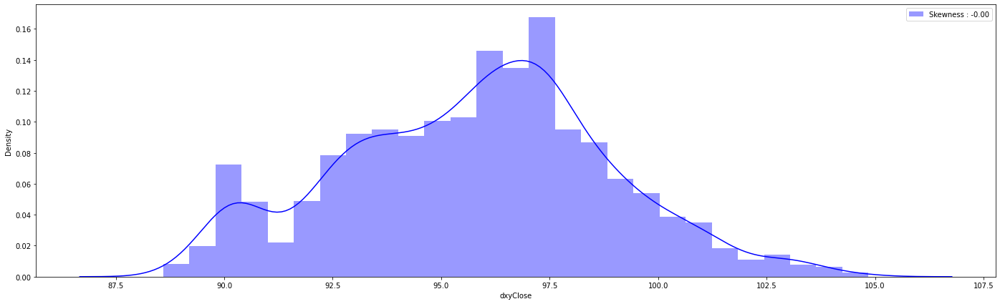

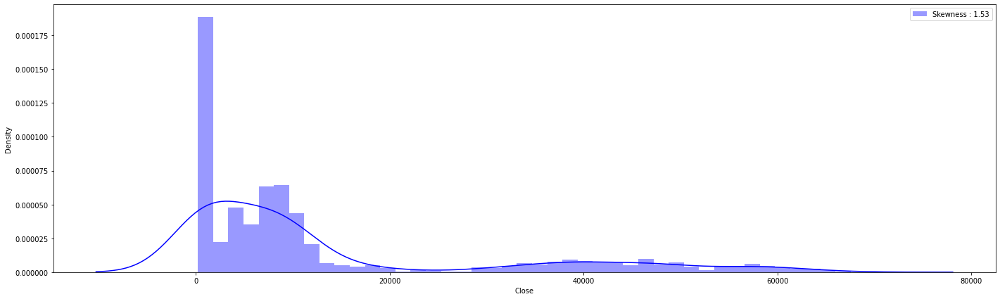

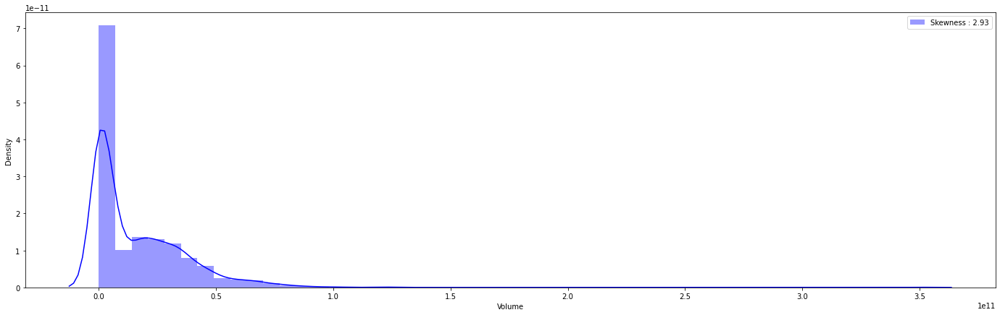

...

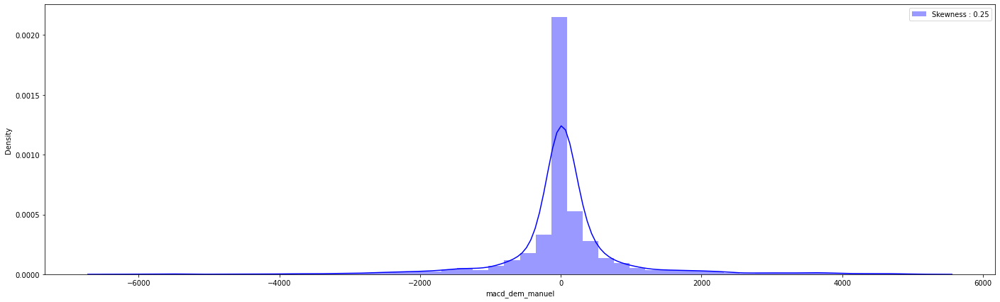

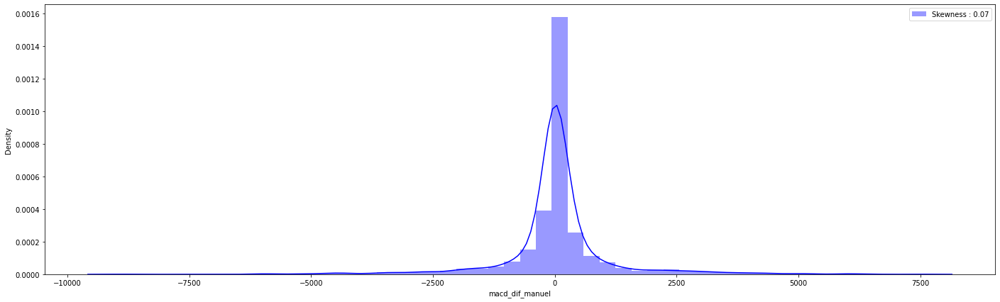

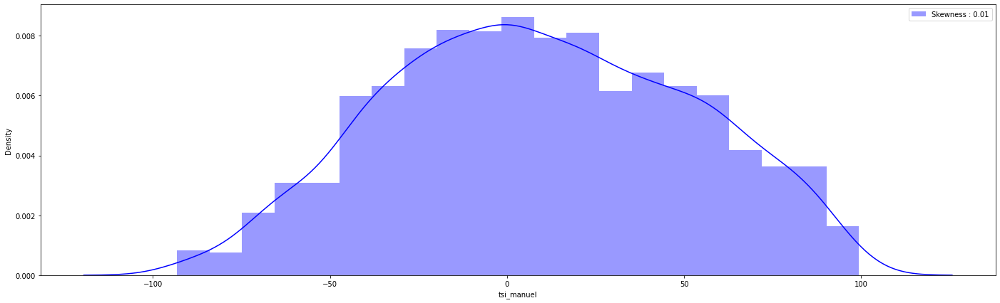

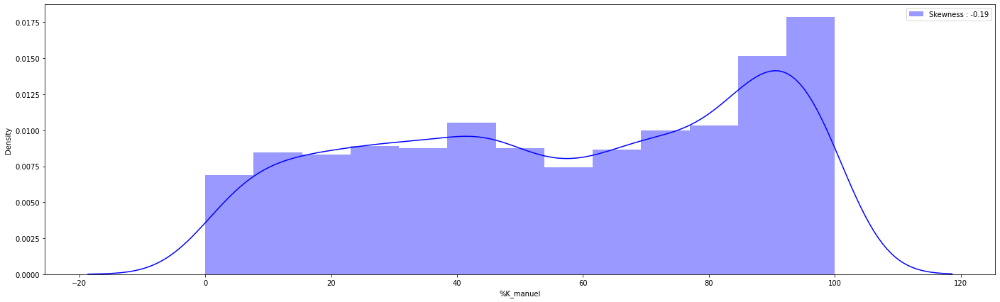

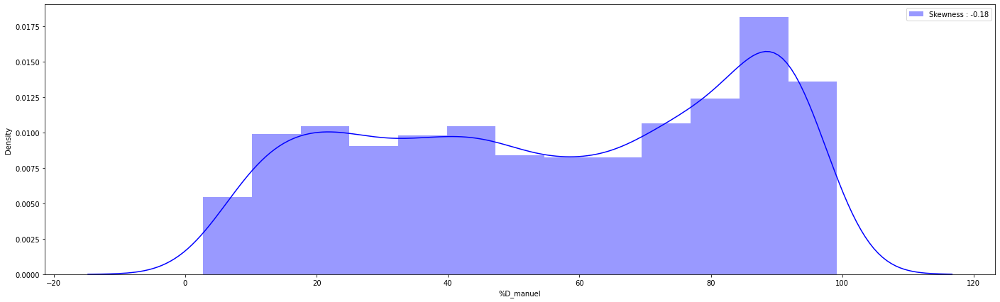

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt
for i in df.columns:
    g = sns.distplot(df[i], color = "b", label = "Skewness : %.2f"%(df[i].skew()))
    g= g.legend(loc="best")
    plt.show()

In [99]:
df[["Close","BTC / Realized Market Cap (USD)","volume_adi","volume_obv","volume_vwap"]]

,Close,BTC / Realized Market Cap (USD),volume_adi,volume_obv,volume_vwap
Date,,,,,
2015-04-04,253.697006,4.169572e+09,-2.362789e+08,-6831236,250.999821
2015-04-05,260.597992,4.170684e+09,-2.169761e+08,12817964,250.575549
2015-04-06,255.492004,4.170775e+09,-2.319234e+08,-7216236,249.729419
2015-04-07,253.179993,4.170651e+09,-2.403877e+08,-25683636,249.640410
2015-04-08,245.022003,4.169414e+09,-2.654326e+08,-55770036,250.124408
...,...,...,...,...,...
2022-05-21,29432.226562,4.536042e+11,4.156002e+12,1817153439152,30297.114786
2022-05-22,30323.722656,4.537076e+11,4.173793e+12,1838784971422,30008.357079
2022-05-23,29098.910156,4.530581e+11,4.147119e+12,1807301516865,29787.341416


In [93]:
def color_red(val):
    if val >0.9 and val < 0.9999999:
        color = "red"
    else:
        color = "black"
    return f"color: {color}"

pd.DataFrame(df.corr().Close).style.applymap(color_red)

,Close
spClose,0.917081
nsdqClose,0.918772
dxyClose,-0.338020
Close,1.000000
Volume,0.710170
BTC / Free Float MVRV (Free Float Market Cap / Realized Market Cap),0.382521
BTC / MVRV (Market Cap / Realized Market Cap),0.455772
BTC / Realized Market Cap (USD),0.937845
BTC / Daily Inflation Rate,-0.605259
BTC / All Time Miner Revenue (USD),0.869024


In [101]:
corr = df.corr()
corr.style.background_gradient(cmap="coolwarm")

In [57]:
ivar = df
ivarcorr = np.linalg.inv((ivar.corr()))
ivarcorr = pd.DataFrame(data = ivarcorr, index= ivar.columns, columns= ivar.columns)
ivarcorr

,spClose,nsdqClose,dxyClose,Close,Volume,BTC / Free Float MVRV (Free Float Market Cap / Realized Market Cap),BTC / MVRV (Market Cap / Realized Market Cap),BTC / Realized Market Cap (USD),BTC / Daily Inflation Rate,BTC / All Time Miner Revenue (USD),BTC / Total Fees (USD),BTC / Exchange Deposits (USD),BTC / Exchange Withdrawals (USD),BTC / Annual Inflation Rate,volume_adi,volume_obv,volume_cmf,volume_fi,volume_em,volume_sma_em,volume_vpt,volume_vwap,volume_mfi,volume_nvi,volatility_bbm,volatility_bbh,volatility_bbl,volatility_bbw,volatility_bbp,volatility_bbhi,volatility_bbli,volatility_kcc,volatility_kch,volatility_kcl,volatility_kcw,volatility_kcp,volatility_kchi,volatility_kcli,volatility_dcl,volatility_dch,volatility_dcm,volatility_dcw,volatility_dcp,volatility_atr,volatility_ui,trend_macd,trend_macd_signal,trend_macd_diff,trend_sma_fast,trend_sma_slow,...,trend_ichimoku_b,trend_stc,trend_adx,trend_adx_pos,trend_adx_neg,trend_cci,trend_visual_ichimoku_a,trend_visual_ichimoku_b,trend_aroon_up,trend_aroon_down,trend_aroon_ind,trend_psar_up,trend_psar_down,trend_psar_up_indicator,trend_psar_down_indicator,momentum_rsi,momentum_stoch_rsi,momentum_stoch_rsi_k,momentum_stoch_rsi_d,momentum_tsi,momentum_uo,momentum_stoch,momentum_stoch_signal,momentum_wr,momentum_ao,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,Sma21_manuel,Sma50_manuel,Sma200_manuel,Ema21_manuel,Ema50_manuel,Ema200_manuel,rsi14_manuel,rsi40_manuel,rsi200_manuel,macd_manuel,macd_dem_manuel,macd_dif_manuel,tsi_manuel,%K_manuel,%D_manuel
spClose,293.140656,-250.972978,-5.189050,3.895402e+02,2.305473,231.855337,-271.227396,-193.505857,9.283049e+02,15.112544,1.334855,0.507712,0.448662,-9.399697e+02,186.938149,-69.602556,0.004396,5.470636,0.390741,0.086036,1.300669,-43.631367,1.600516,-8.779743,4.847227e+02,-1.868604e+02,-1.138455e+02,8.039995,8.140368,0.055932,-1.073860,-5.215391e+02,5.152801e+02,4.139401e+02,7.842470,-1.207847,-0.196173,1.027804,-7.305830e+02,-8.885528e+02,1.544389e+03,-8.311045,-7.393479,-16.554231,4.039431,-1.591840e+02,-1.913158e+00,8.131711e+00,-245.804126,-3.459480,...,28.410333,-1.560685,1.378019,-3.153814,2.664047,-5.645658,0.117290,7.415344,-1.998071e+02,1.967408e+02,3.778954e+02,0.430010,-14.115601,-0.023528,-0.111137,-3.532894e+03,-2.501191,-0.191516,-1.822865,3.445690,-2.652028,-4.483864e+02,-3.609998e+03,-2.187751e+02,10.203238,-2.734051,-7.467396e+01,3.746705e+01,2.582899e+01,6.987783e+00,-9.458443e+00,-1.130303e+00,96.566684,18.022378,-17.047072,-94.993413,68.125473,-89.293512,-2256.521207,431.137066,-10.732361,3.223649e+03,-9.352199,14.639563,-5.703594e+01,-1.181945e+02,1.152065e+02,9.737198,6.340595e+02,3.306223e+03
nsdqClose,-250.972978,303.542863,10.801192,-9.516796e+02,-0.732261,-182.626756,215.209220,352.583050,-2.274289e+03,-114.512878,1.434359,-0.255939,-1.024779,2.294864e+03,-159.573355,38.548105,-2.238028,-4.566434,-0.076612,3.963706,-0.867311,10.335495,-1.122495,-0.112653,-7.408124e+02,3.824487e+02,2.678693e+02,-5.091026,-5.028060,0.034280,1.319779,1.329040e+03,-8.352522e+02,-6.802979e+02,-4.590876,2.384786,-0.649066,-1.347365,1.985815e+03,2.597369e+03,-4.481420e+03,4.076079,9.084101,8.970318,-2.798805,4.285715e+02,-1.568565e+01,-7.199196e+01,-213.521755,129.664525,...,-109.047816,1.584175,-3.247418,5.962402,1.893491,0.076936,77.467257,-55.974496,4.396125e+02,-4.323716e+02,-8.070827e+02,-1.735877,18.537738,-0.277676,0.014709,8.202054e+03,-0.094637,-0.627242,2.538651,0.479495,1.809535,2.109839e+03,9.322491e+03,7.019419e+02,-7.902808,2.536674,2.106135e+02,-1.711593e+02,-5.985245e+01,-6.094630e+01,5.224685e+01,2.455694e+01,-145.222591,-12.300394,11.020940,-95.406422,-15.035152,154.217241,6005.825972,-1388.867118,48.483027,-7.815778e+03,2.718678,-0.147273,2.550449e+01,1.013621e+02,-1.078068e+01,-6.691019,-2.753494e+03,-9.000162e+03
dxyClose,-5.189050,10.801192,4.145829,2.978051e+01,-0.215261,-1.959638,-2.830885,5.673626,-2.9796

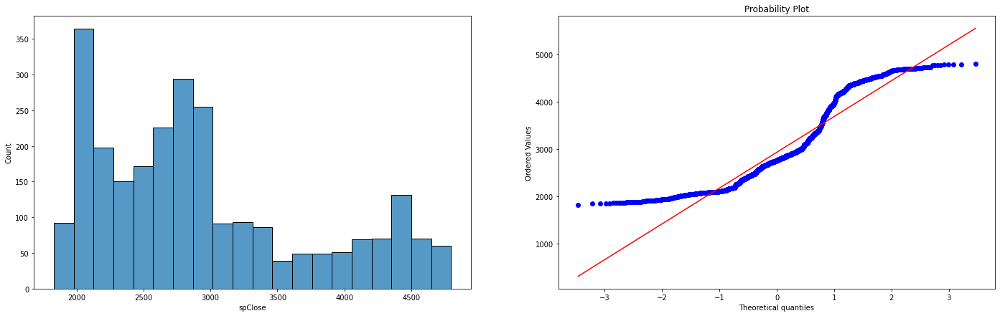

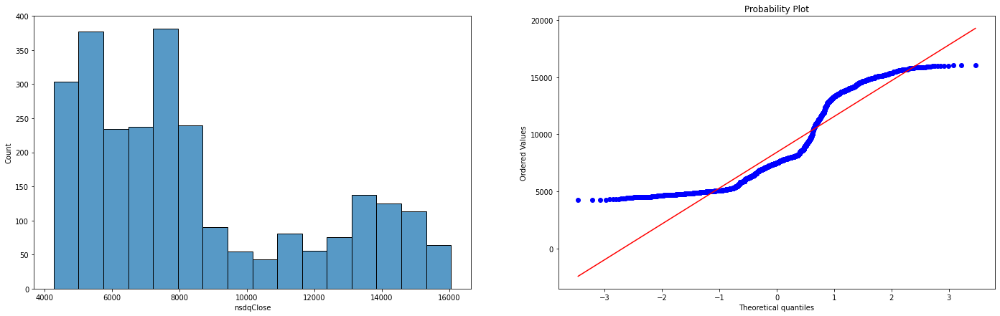

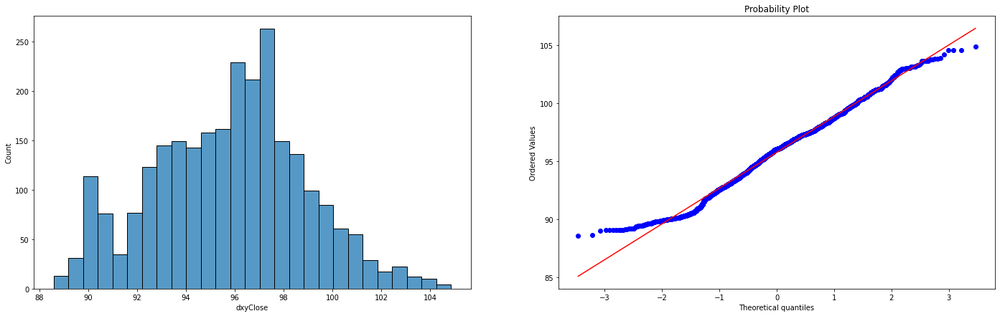

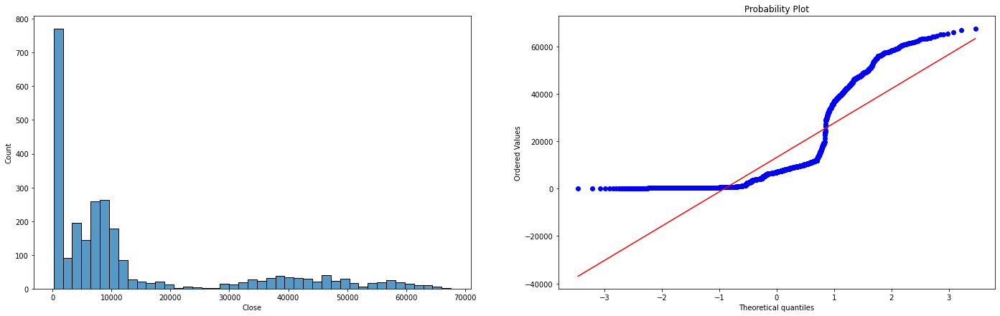

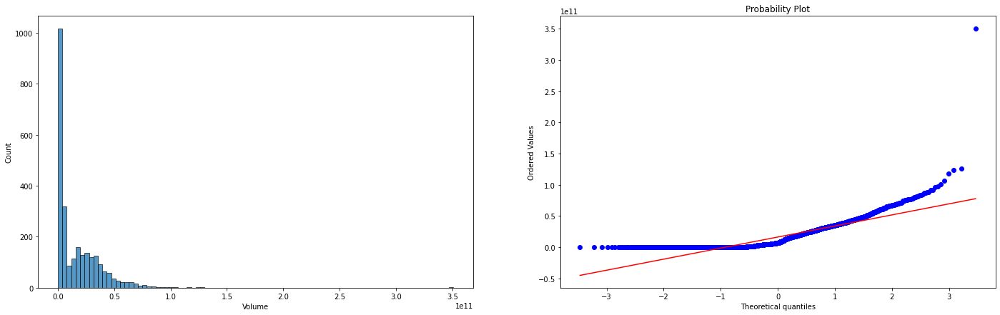

...

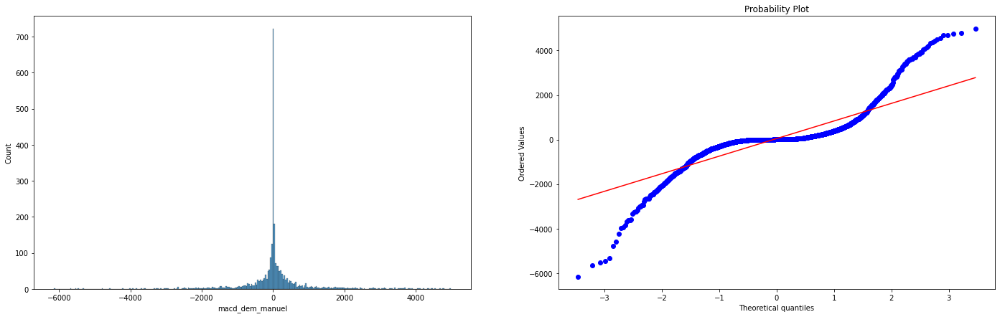

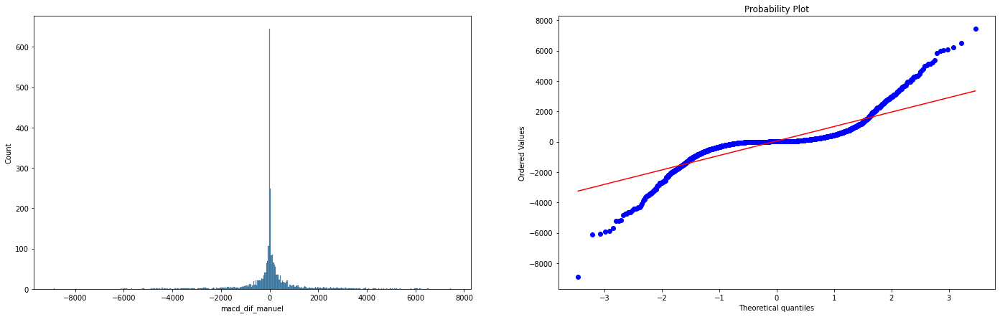

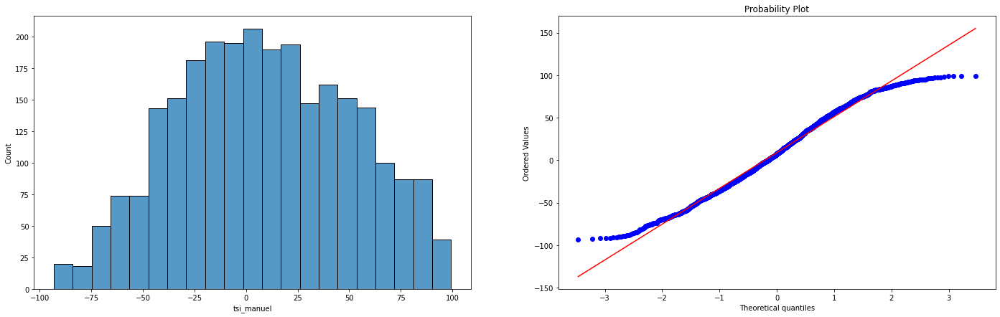

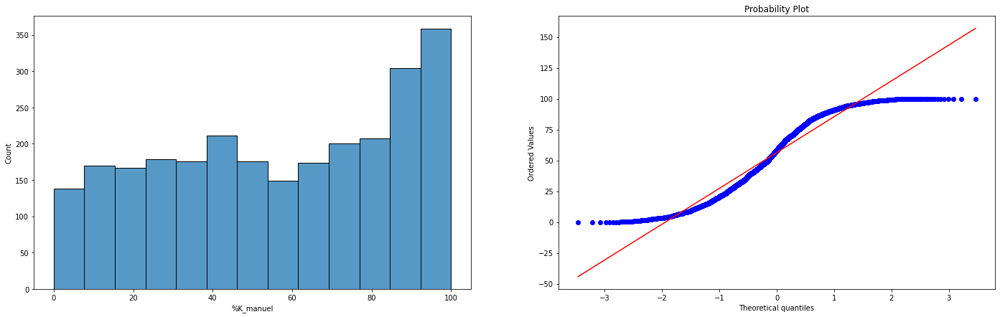

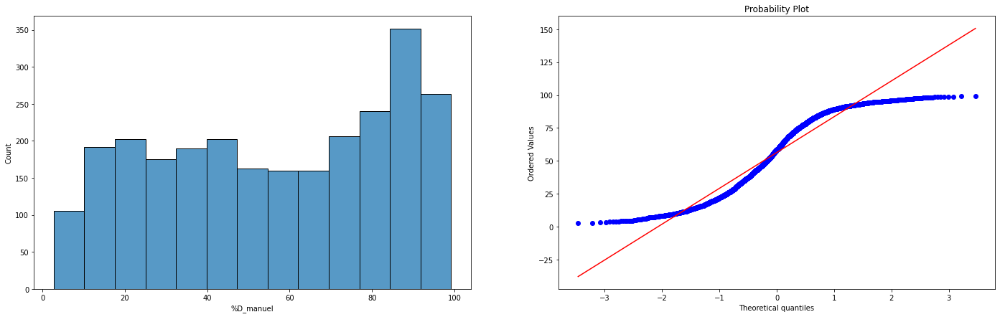

In [58]:
def check_dist(df, var):
    plt.subplot(1,2,1)
    sns.histplot(x=var, data=df)
    plt.subplot(1,2,2)
    stats.probplot(df[var], dist = "norm", plot = plt)
    plt.show()

for col in df.columns:
    check_dist(df, col)

In [59]:
df.shape

(2609, 114)

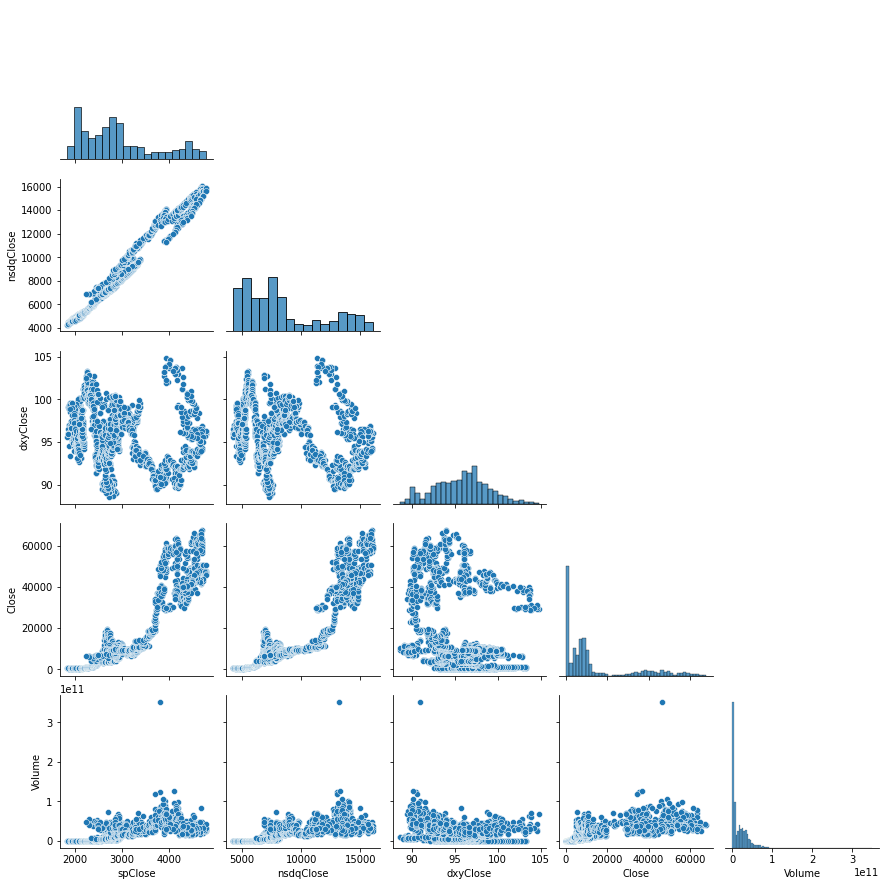

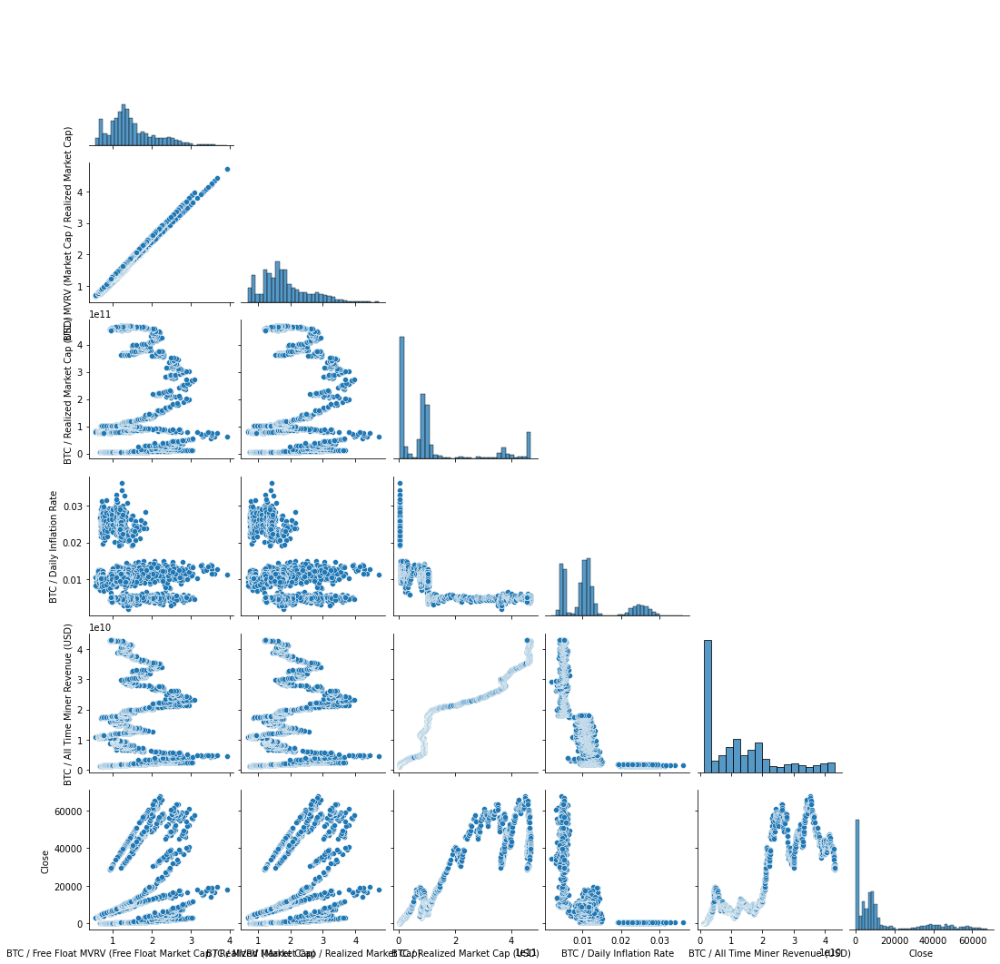

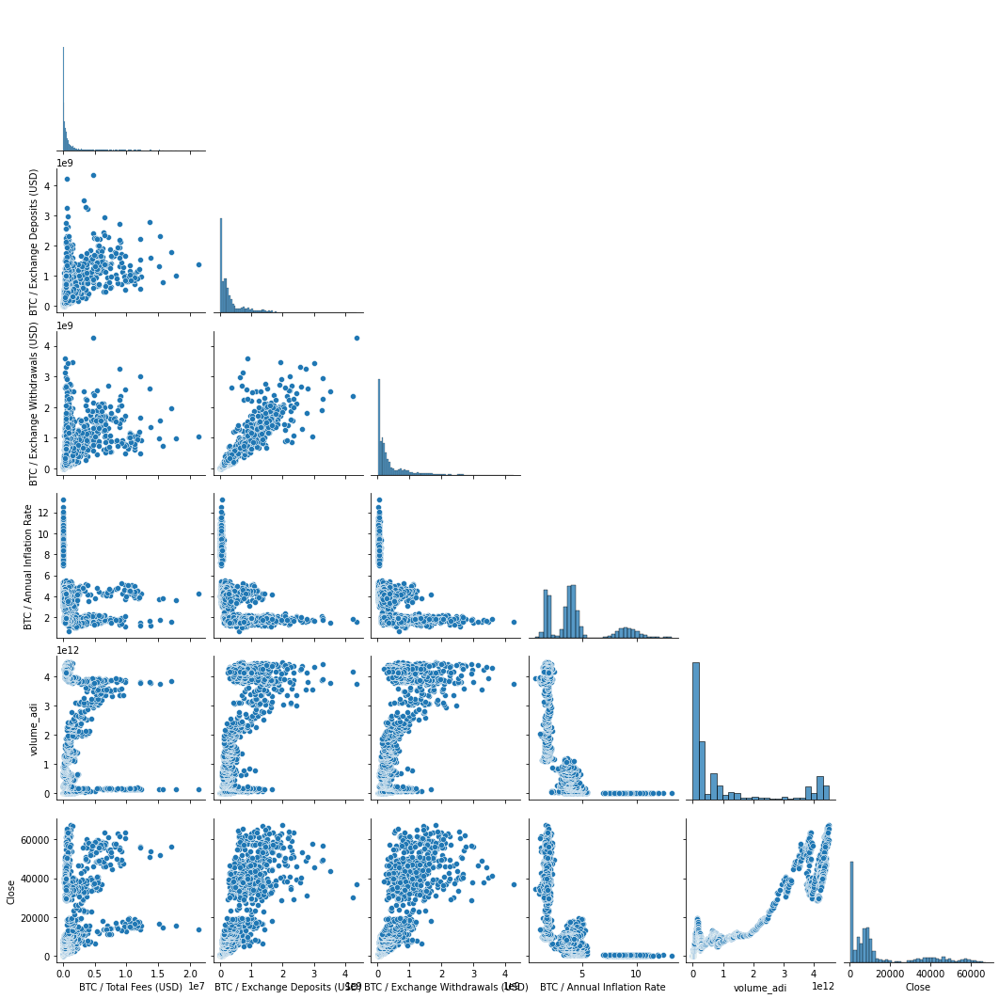

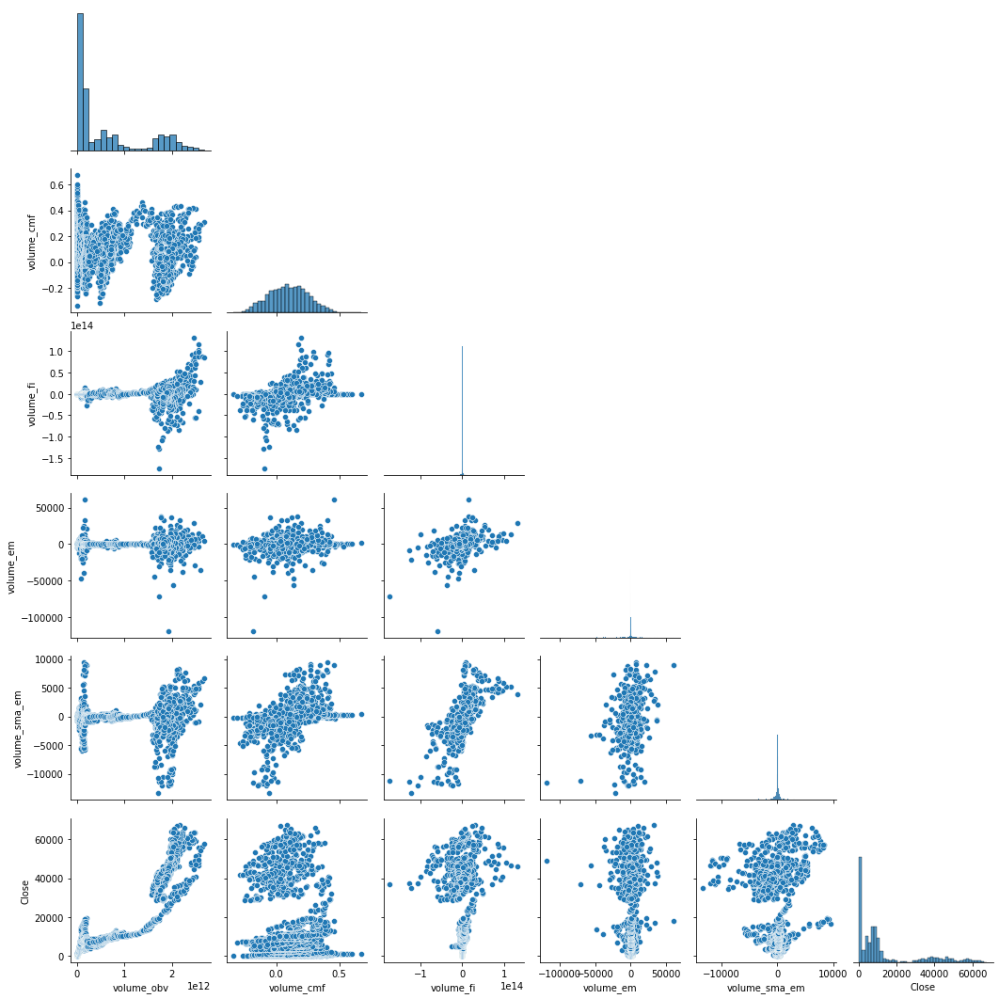

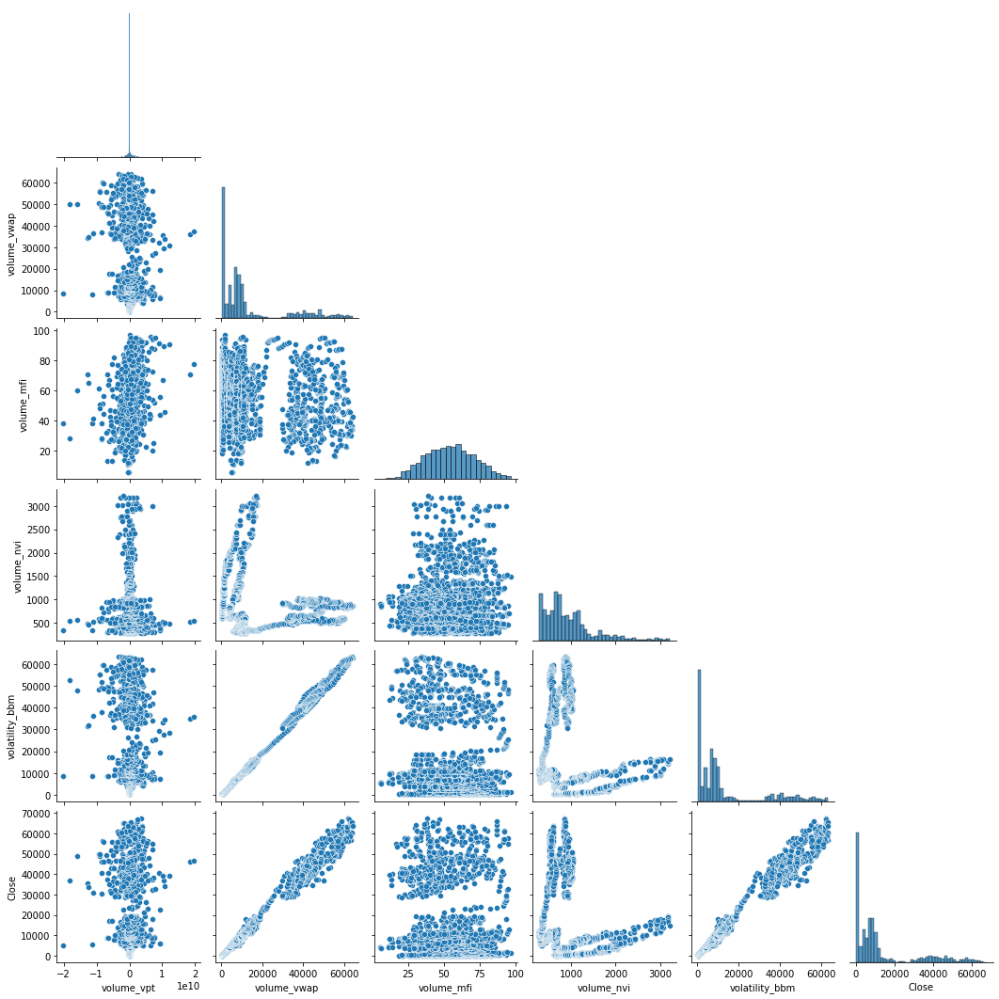

...

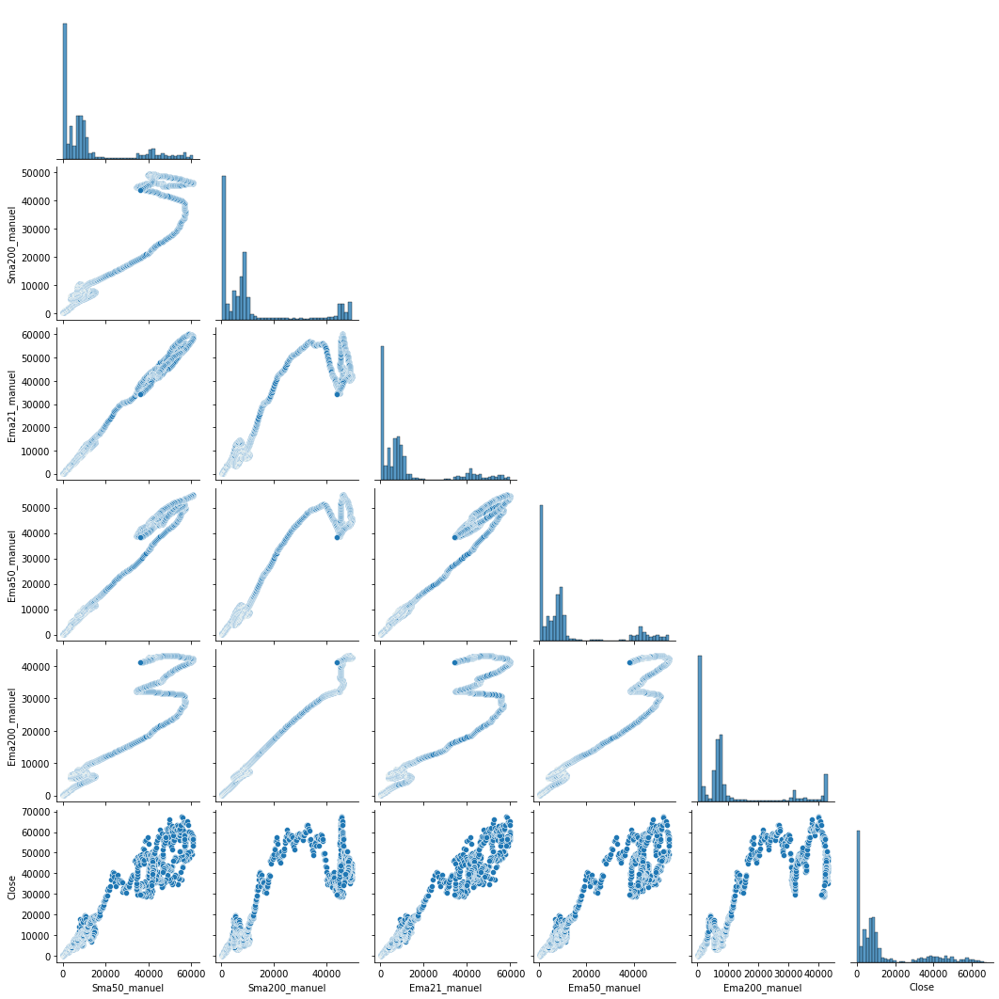

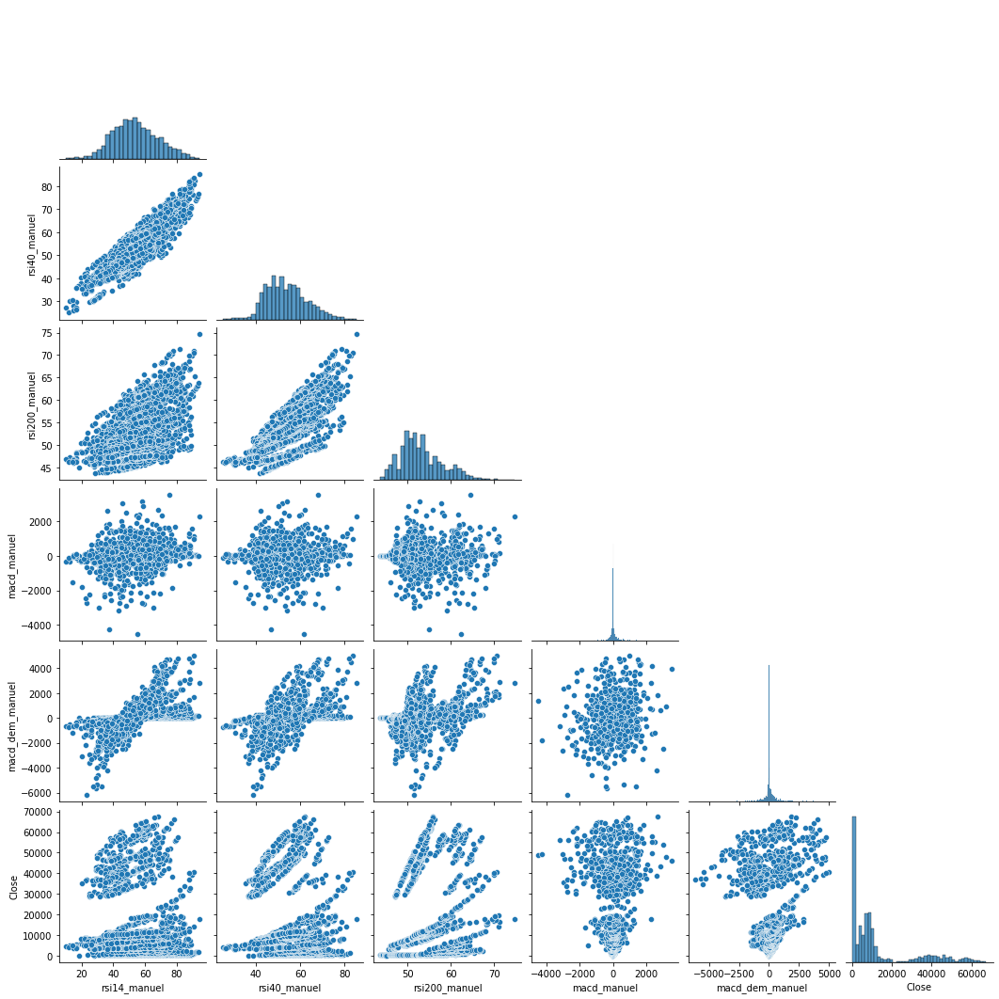

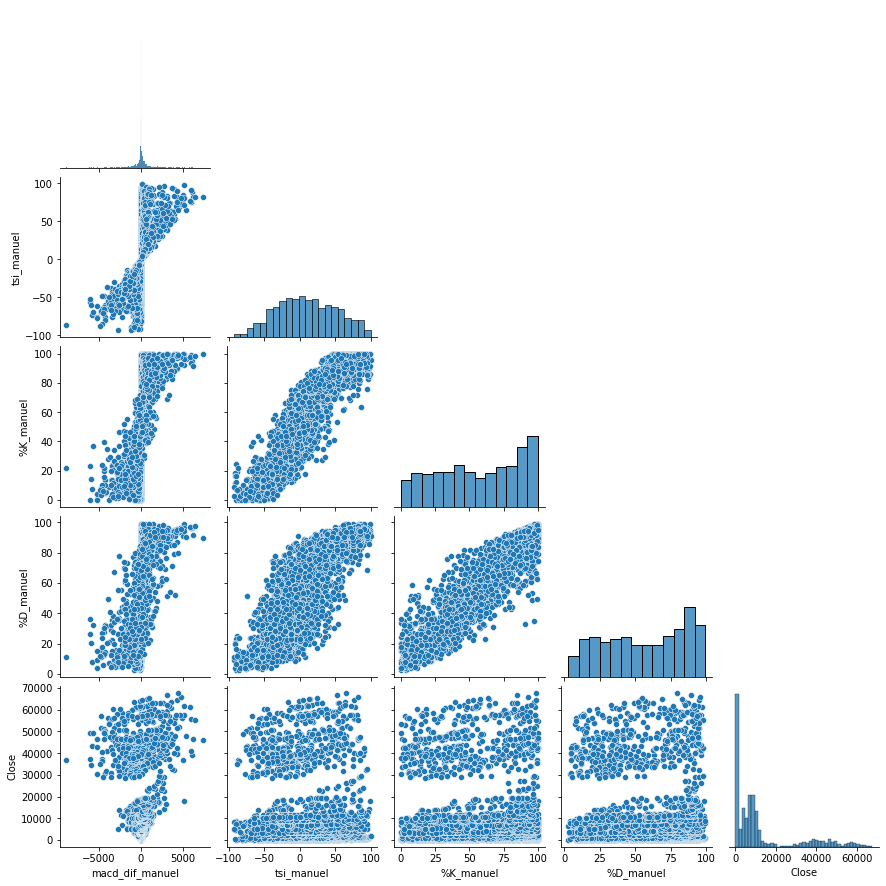

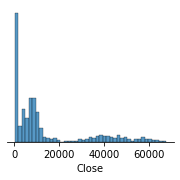

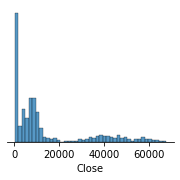

In [60]:
def pairplot(df):
    sns.pairplot(data = df, corner = True)
    plt.show()

close = df.Close
for i in np.arange(0,125,5):
    data = df.iloc[:, i:i+5]
    data["Close"] = close
    pairplot(data)


In [61]:
np.arange(0,100,6)

array([ 0,  6, 12, 18, 24, 30, 36, 42, 48, 54, 60, 66, 72, 78, 84, 90, 96])

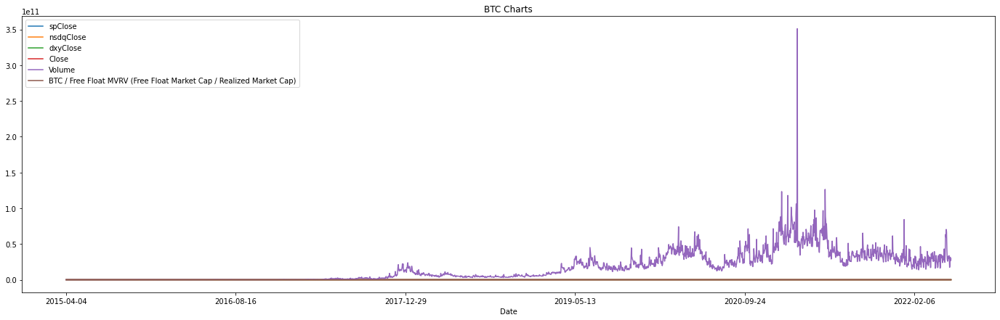

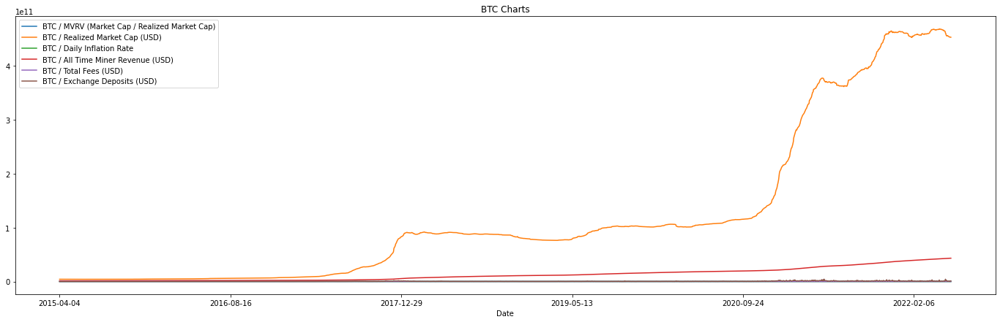

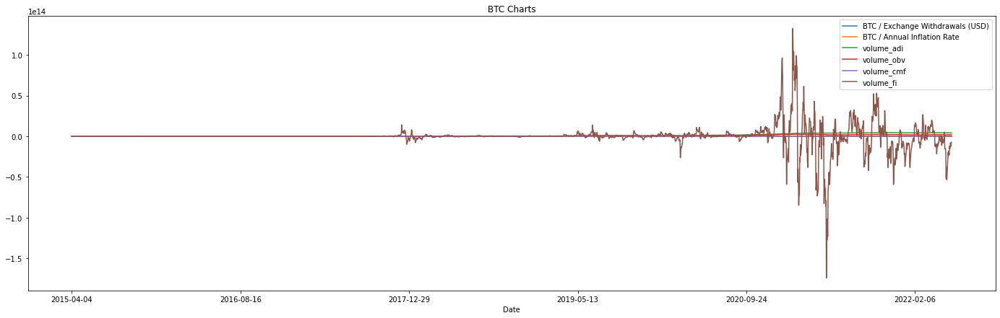

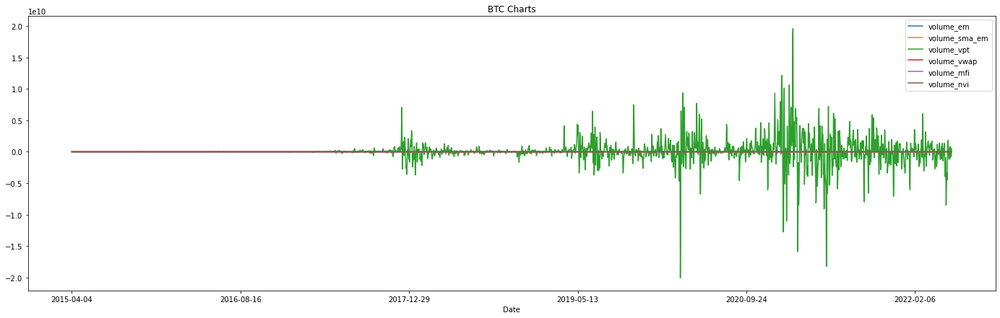

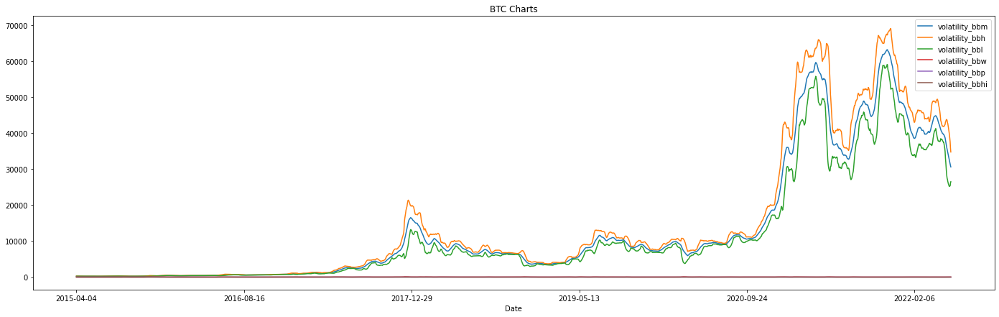

...

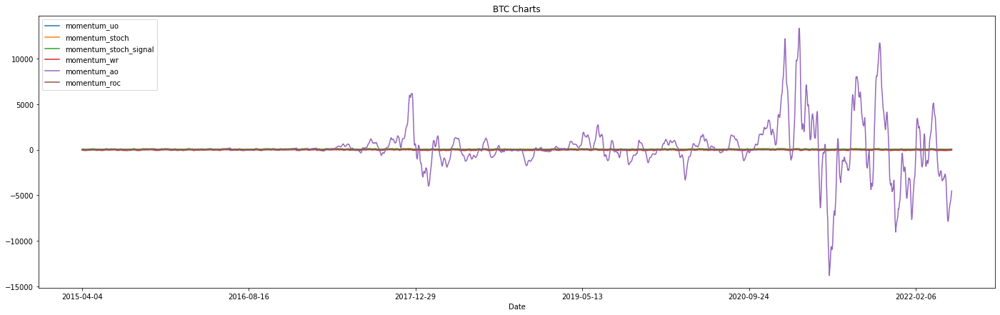

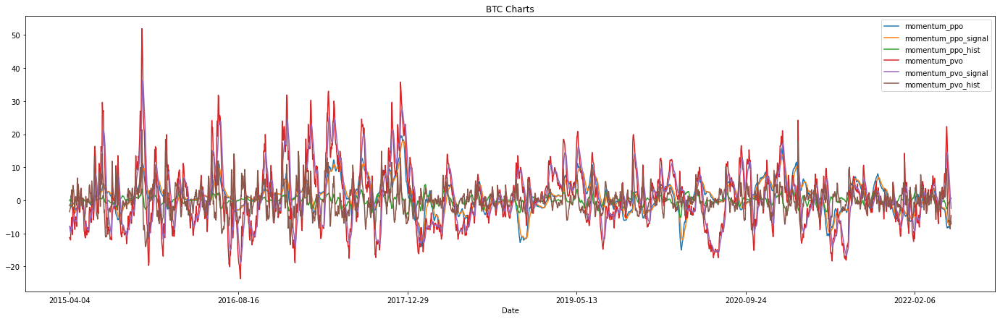

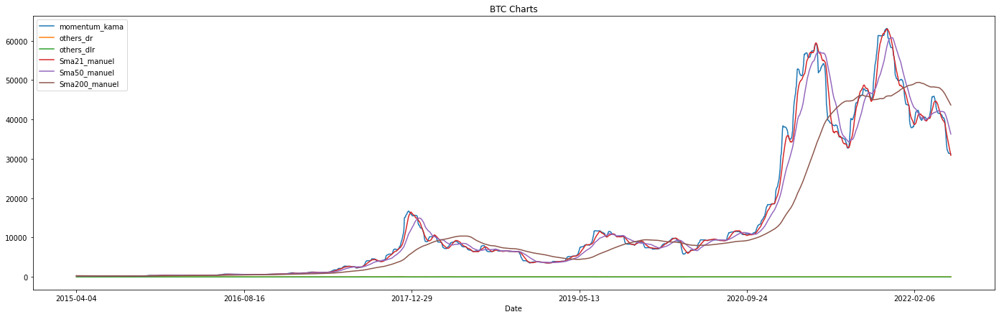

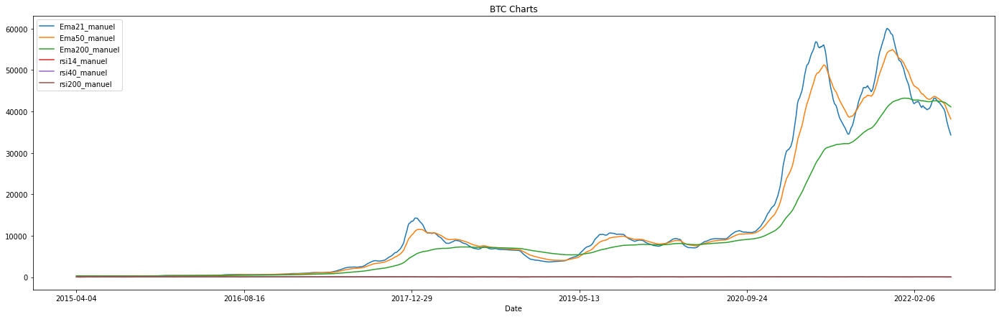

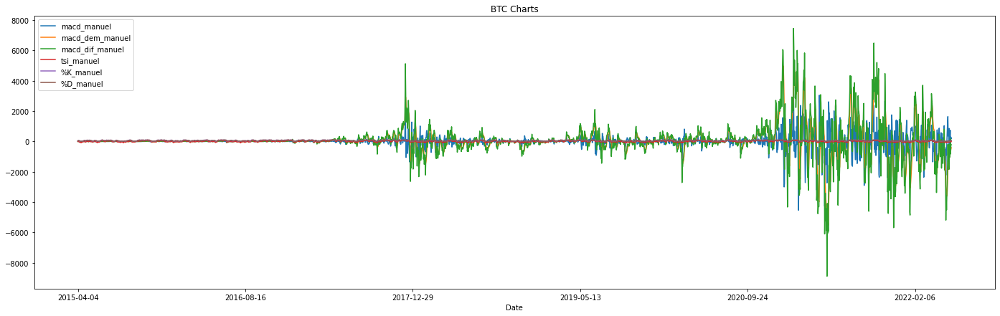

TypeError: no numeric data to plot

In [62]:
for i in np.arange(0,120,6):
    data = df.iloc[:, i:i+6]
    data.plot(title="BTC Charts")
    plt.legend()
    plt.show()
data_end =df.iloc[:, 114:]
data.plot(title="BTC Charts")
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


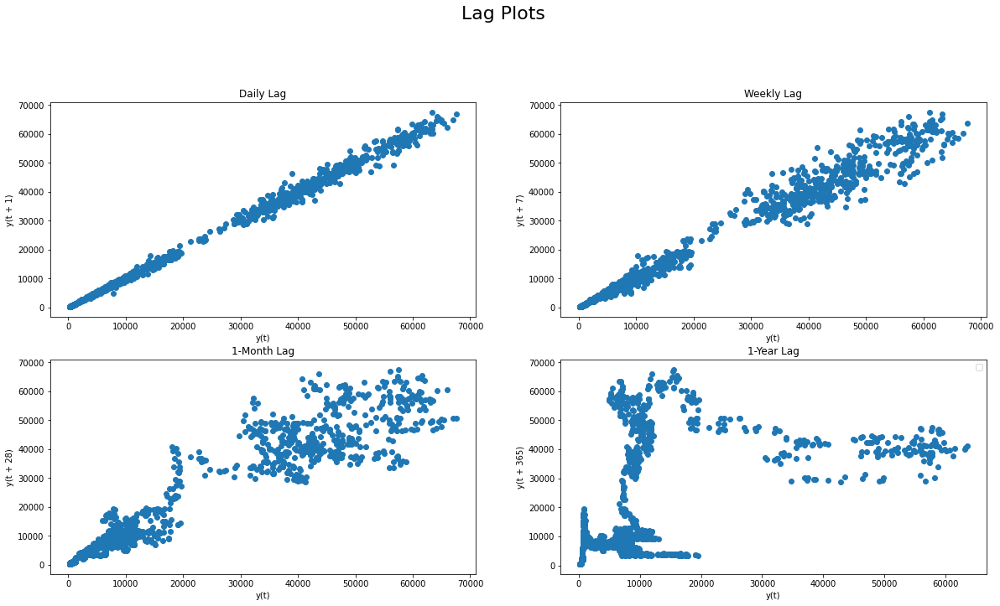

In [63]:
plt.figure(figsize=(20,16))
plt.suptitle('Lag Plots', fontsize=22)


plt.subplot(3,2,1)
pd.plotting.lag_plot(df['Close'], lag=1) #Daily lag
plt.title('Daily Lag')

plt.subplot(3,2,2)
pd.plotting.lag_plot(df['Close'], lag=7) #weekly lag
plt.title('Weekly Lag')

plt.subplot(3,2,3)
pd.plotting.lag_plot(df['Close'], lag=28) #month lag
plt.title('1-Month Lag')

plt.subplot(3,2,4)
pd.plotting.lag_plot(df['Close'], lag=365) #1Year lag
plt.title('1-Year Lag')

plt.legend()
plt.show()


In [ ]:
## Lin-Reg

In [78]:
df = add_ta_features()
df.drop(columns=dropped_columns, inplace=True)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [79]:
train_size = int(len(df) * 0.6)
test_size = int(len(df) - train_size)
train = df.iloc[0:train_size, :]
test = df.iloc[train_size:len(df), :]
print("train size: {}, test size: {}". format(len(train), len(test)))


train size: 1565, test size: 1044


In [80]:
y = df["Close"]
X = df.drop(columns="Close", axis=1)

In [81]:
X_train = train.drop(columns="Close")
y_train = train["Close"]
X_test = test.drop(columns="Close")
y_test = test["Close"]


print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)
print("y_train: ", y_train.shape)
print("y_test: ", y_test.shape)

X_train:  (1565, 113)
X_test:  (1044, 113)
y_train:  (1565,)
y_test:  (1044,)


In [82]:
from sklearn.linear_model import LinearRegression
lin_model = LinearRegression()
lin_model.fit(X_train, y_train)

LinearRegression()

In [83]:
y_pred = lin_model.predict(X_test)
y_pred

array([ 9693.80270981, 10666.48200974, 10530.73222267, ...,
       29098.90885889, 29655.58437385, 29792.36374254])

In [84]:
my_dict = {"Actual": y_test, "pred": y_pred, "residual": y_test - y_pred }
comparing = pd.DataFrame(my_dict)
comparing

,Actual,pred,residual
Date,,,
2019-07-17,9693.802734,9693.802710,0.000025
2019-07-18,10666.482422,10666.482010,0.000412
2019-07-19,10530.732422,10530.732223,0.000199
2019-07-20,10767.139648,10767.139386,0.000262
2019-07-21,10599.105469,10599.105235,0.000234
...,...,...,...
2022-05-21,29432.226562,29432.225079,0.001483
2022-05-22,30323.722656,30323.720675,0.001981
2022-05-23,29098.910156,29098.908859,0.001297


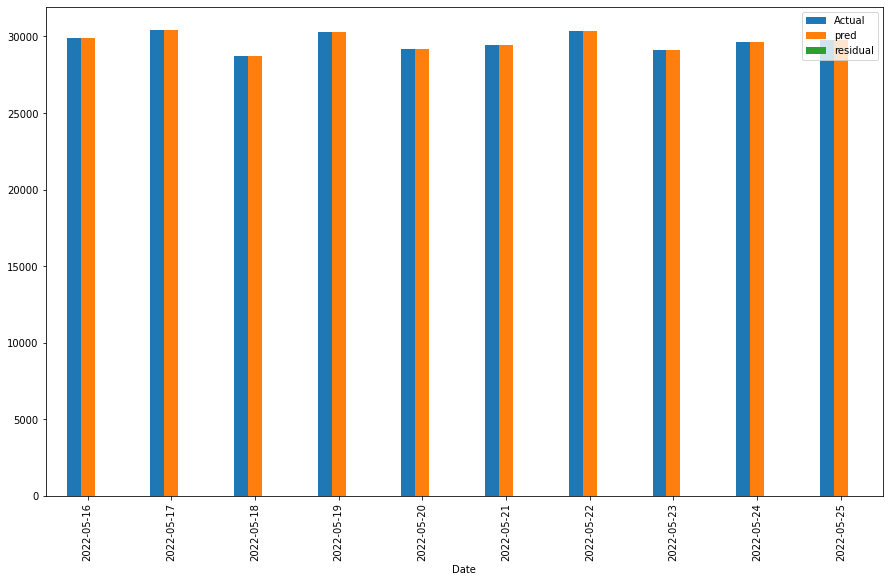

In [85]:
comparing[-10:].plot(kind = "bar", figsize=(15,9))
plt.show()

In [86]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
def eval_metric(actual,pred):
    mae = mean_absolute_error(actual,pred)
    mse = mean_squared_error(actual,pred)
    rmse = np.sqrt(mean_squared_error(actual,pred))
    R2_score = r2_score(actual,pred)
    print("Model Testing Performance: ")
    print("---------------------------")
    print(f"R2_score \t: {R2_score}")
    print(f"MAE \t\t: {mae}")
    print(f"MSE \t\t: {mse}")
    print(f"RMSE \t\t: {rmse}")

In [87]:
eval_metric(y_test, y_pred)

Model Testing Performance: 
---------------------------
R2_score 	: 0.9999999999999871
MAE 		: 0.0015219453012759495
MSE 		: 4.550477323431412e-06
RMSE 		: 0.0021331847841739855


In [88]:
y_train_pred = lin_model.predict(X_train)
eval_metric(y_train,y_train_pred)

Model Testing Performance: 
---------------------------
R2_score 	: 0.9999999999999987
MAE 		: 8.491658869683199e-05
MSE 		: 1.900466400176176e-08
RMSE 		: 0.00013785740459533452


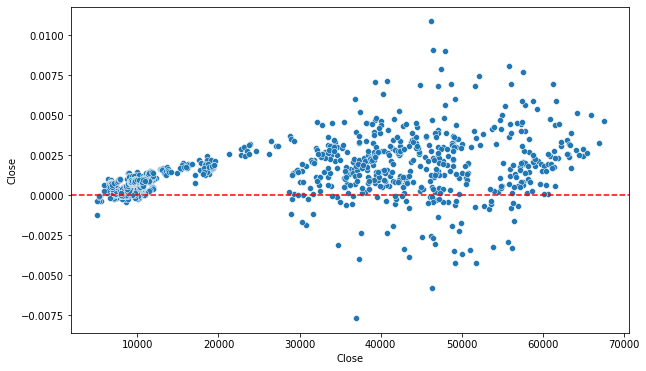

In [89]:
residuals = y_test - y_pred

plt.figure(figsize = (10,6))
sns.scatterplot(x = y_test, y = residuals)
plt.axhline(y = 0, color="r", linestyle= "--")
plt.show()

<AxesSubplot:xlabel='Close', ylabel='Density'>

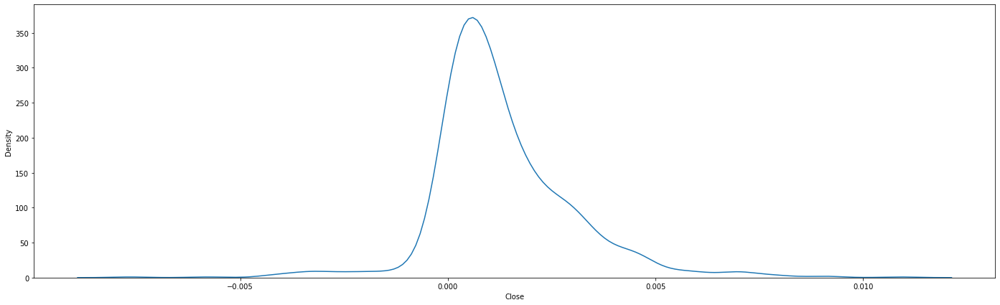

In [90]:
sns.kdeplot(residuals)

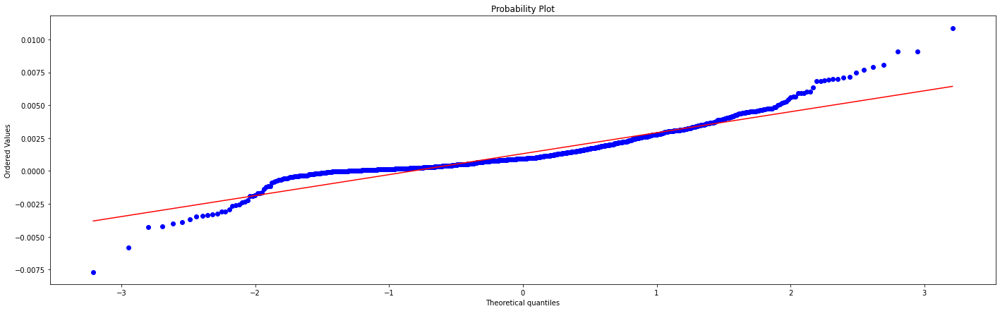

In [91]:
stats.probplot(residuals, dist= "norm", plot= plt);

In [102]:
import pickle
# save the model to disk
filename = 'LinReg_model.sav'
pickle.dump(lin_model, open(filename, 'wb'))

In [ ]:
""" # load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test,y_test)
print(result) """

In [ ]:
""" import joblib
# save the model to disk
filename = 'LinReg_model.sav'
joblib.dump(lin_model, filename)
 
# load the model from disk
loaded_model = joblib.load(filename)
result = loaded_model.score(X_test, y_test)
print(result) """

In [217]:
## Polinomial Reg yapmaya gerek yok Log-Reg iyi sonuç verdi

## Multicollinearty var 0.9dan buyukleri drop edeceğim Done 


## Her Column ile gelecek 10gunu predict ettireyim.(LSTM ile) Sonra bu predictionları ind. var. olarak Log reg'te tahmin ettireyim

In [ ]:
# Log-Regression
# Pol-Log-Reg
# Pipeline - Grid